In [236]:
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.datasets import load_boston
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
import os
#load boston
boston_housing = load_boston()
columns_names = boston_housing.feature_names
y = boston_housing.target
X = boston_housing.data
scaler = MinMaxScaler()
X = scaler.fit_transform(X)


C:\Users\Jean-Philippe\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


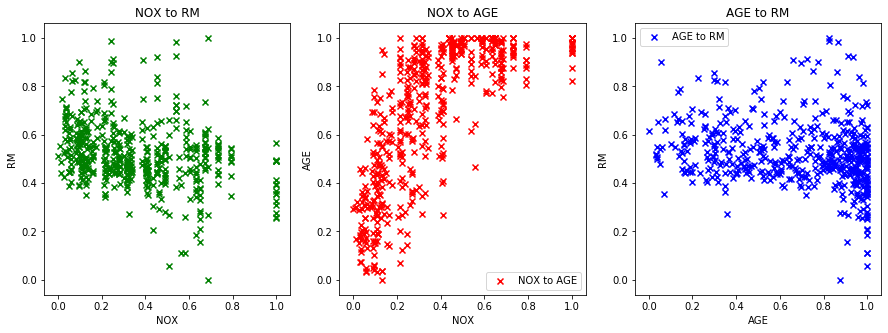

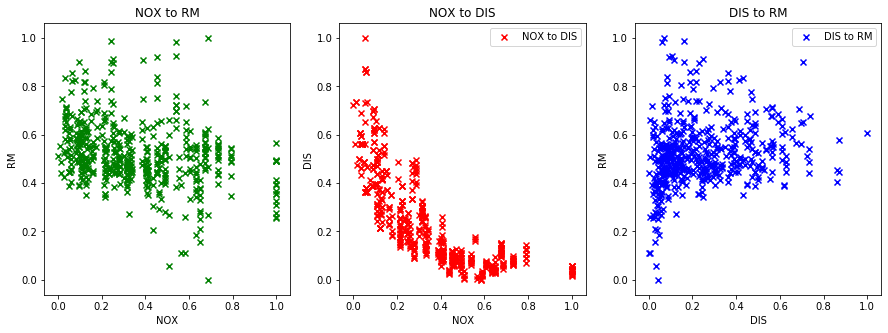

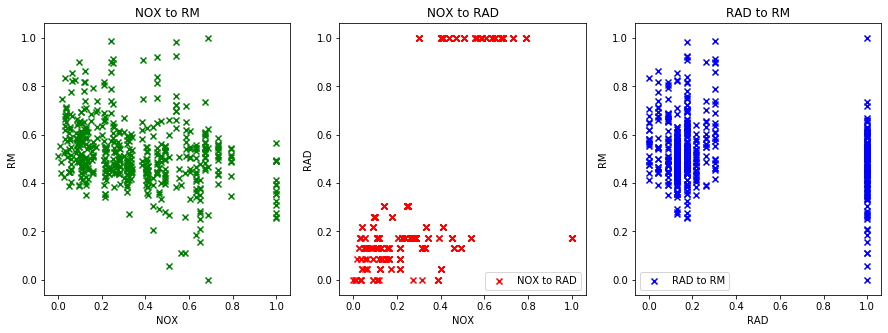

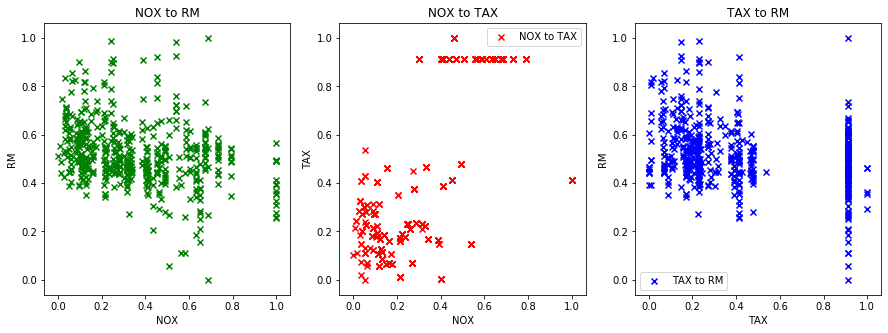

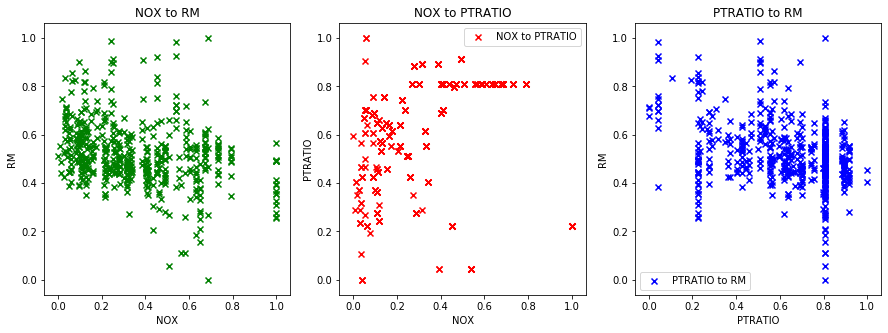

...

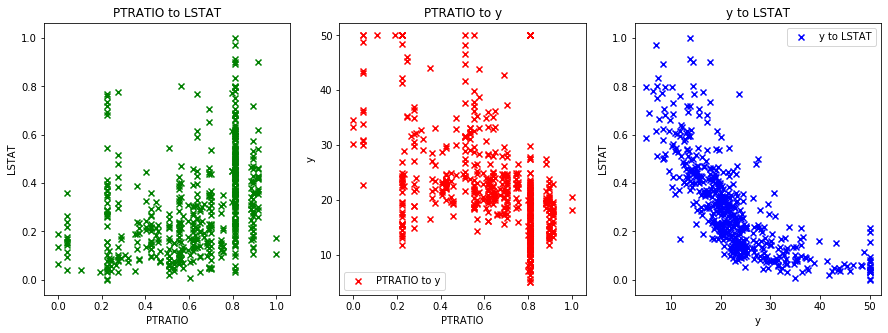

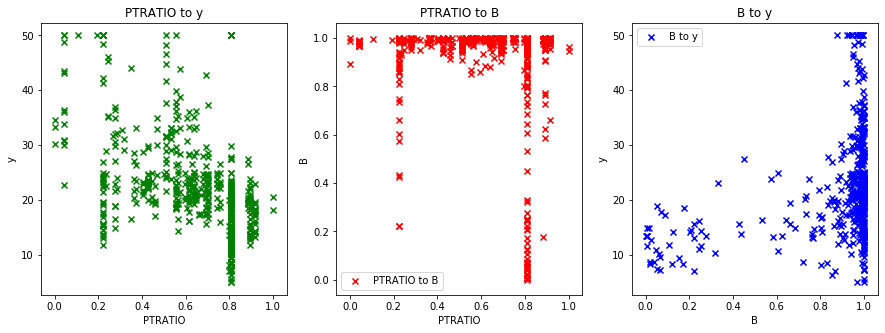

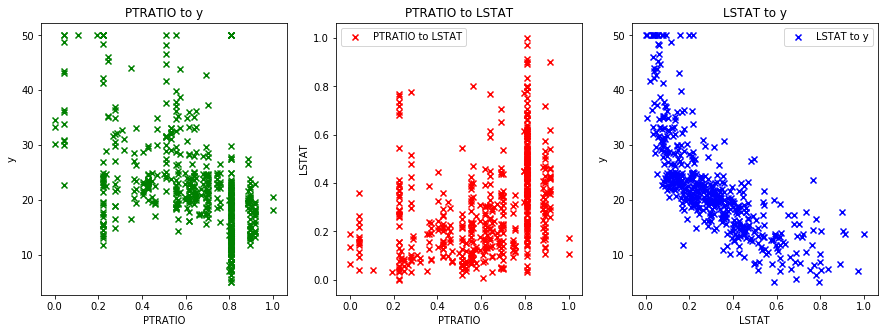

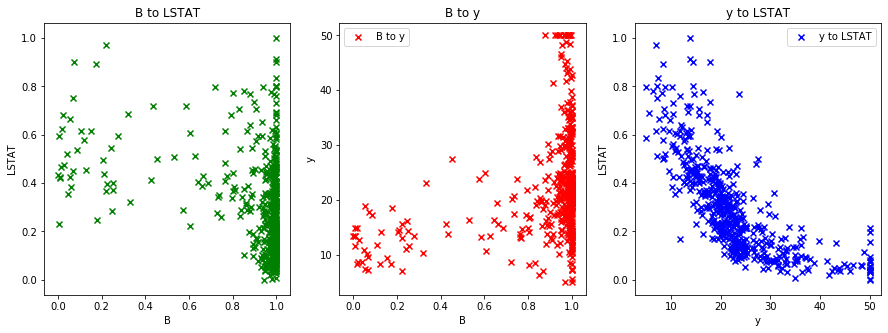

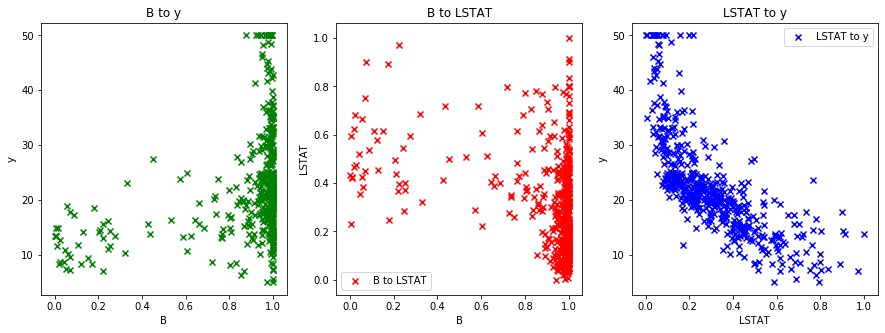

In [237]:
#boston_housing plotting
bh=pd.DataFrame(X,columns=columns_names)#put data in pandas dataFrame
bh['y']=y
df=bh
os.makedirs('plots/7-matplotlib_dataset_exploration', exist_ok=True)
for col1_idx, column1 in enumerate(df.columns):
    for col2_idx, column2 in enumerate(df.columns):
        for col3_idx, column3 in enumerate(df.columns):
            if col1_idx < col2_idx and col1_idx < col3_idx and col1_idx >3 and col2_idx!=col3_idx:
                
                fig, axes = plt.subplots(1, 3, figsize=(15, 5))
                axes[0].scatter(df[column1], df[column2], label=f'{column1} to {column2}', color='green', marker='x')
                axes[0].set_title(f'{column1} to {column2}')
                axes[0].set_xlabel(column1)
                axes[0].set_ylabel(column2)
                axes[0].legend
                
                axes[1].scatter(df[column1], df[column3], label=f'{column1} to {column3}', color='r', marker='x')
                axes[1].set_title(f'{column1} to {column3}')
                axes[1].set_xlabel(column1)
                axes[1].set_ylabel(column3)
                axes[1].legend()
                
                axes[2].scatter(df[column3], df[column2], label=f'{column3} to {column2}', color='b', marker='x')
                axes[2].set_title(f'{column3} to {column2}')
                axes[2].set_xlabel(column3)
                axes[2].set_ylabel(column2)
                axes[2].legend()
                plt.savefig(f'plots/7-matplotlib_dataset_exploration/housing{column1}_{column2}_{column3}_scatter.png', dpi=300)

C:\Users\Jean-Philippe\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


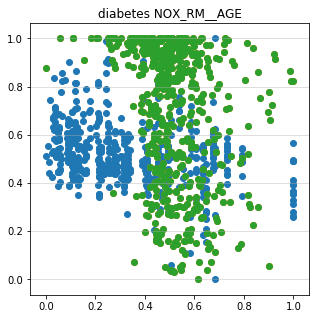

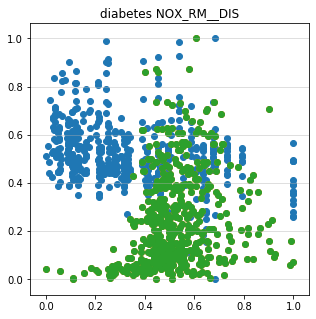

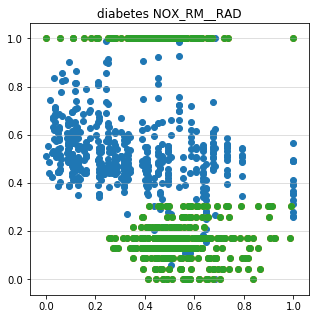

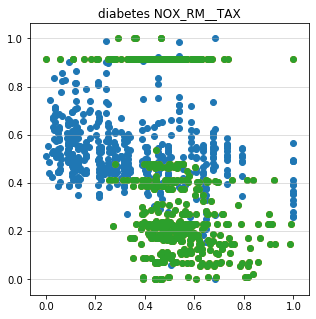

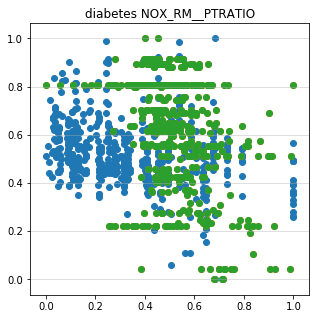

...

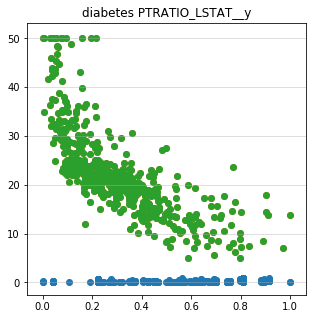

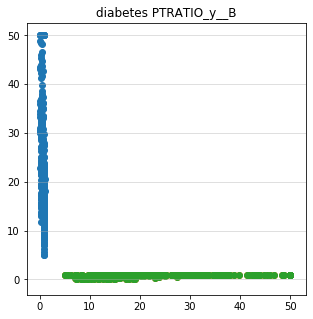

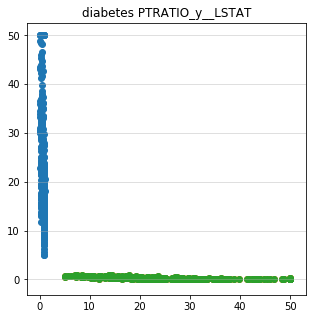

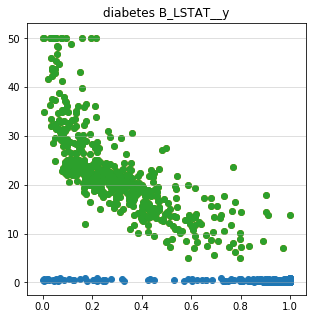

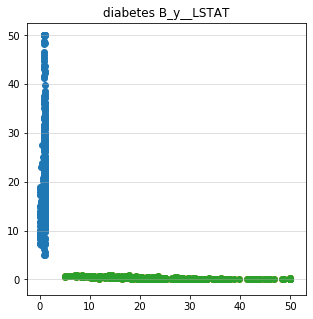

In [238]:
#boston_housing plotting pt2
for col1_idx, column1 in enumerate(df.columns):
    for col2_idx, column2 in enumerate(df.columns):
        for col3_idx, column3 in enumerate(df.columns):
            if col1_idx < col2_idx and col1_idx < col3_idx and col1_idx >3 and col2_idx!=col3_idx:
                
                fig, axes = plt.subplots(1, 1, figsize=(5, 5))
                axes.grid(axis='y', alpha=0.5)
                axes.scatter(df[column1], df[column2])
                axes.scatter(df[column2], df[column3])
                axes.scatter(df[column2], df[column3])
                axes.set_title(f'diabetes {column1}_{column2}__{column3}')

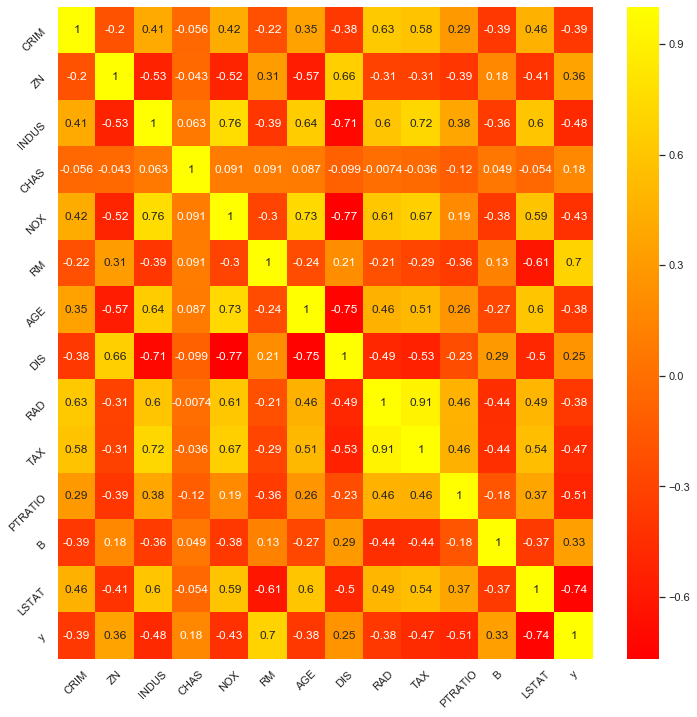

In [239]:
#boston_housing corr plotting
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns


os.makedirs('plots/13-seaborn_heatmap', exist_ok=True)

sns.set()

fig, ax = plt.subplots(figsize=(12,12))
sns.heatmap(df.corr(), annot=True, cmap='autumn')
ax.set_xticklabels(df.columns, rotation=45)
ax.set_yticklabels(df.columns, rotation=45)
plt.savefig('plots/13-seaborn_heatmap/housing_heatmap.png')

In [240]:
#split data in train and test and 1st Regression model with all the variables
bhtrain=bh[:250]
bhtest=bh[250:]
reg_multi = smf.ols('y~CRIM+ZN+INDUS+CHAS+NOX+RM+AGE+DIS+RAD+TAX+PTRATIO+B+LSTAT', data=bhtrain).fit()
print(reg_multi.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.856
Model:                            OLS   Adj. R-squared:                  0.848
Method:                 Least Squares   F-statistic:                     107.7
Date:                Tue, 19 Nov 2019   Prob (F-statistic):           2.57e-91
Time:                        16:37:35   Log-Likelihood:                -643.72
No. Observations:                 250   AIC:                             1315.
Df Residuals:                     236   BIC:                             1365.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      5.6974      2.995      1.903      0.0

In [204]:
#2nd Regression model with only p<0.10 variables
reg_multi = smf.ols('y~CRIM+ZN+NOX+RM+AGE+DIS+TAX+PTRATIO+B+LSTAT', data=bhtrain).fit()
print(reg_multi.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.854
Model:                            OLS   Adj. R-squared:                  0.848
Method:                 Least Squares   F-statistic:                     140.0
Date:                Tue, 19 Nov 2019   Prob (F-statistic):           5.82e-94
Time:                        03:43:09   Log-Likelihood:                -645.06
No. Observations:                 250   AIC:                             1312.
Df Residuals:                     239   BIC:                             1351.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      5.8062      2.974      1.952      0.0

In [205]:
#3nd Regression model with only p<0.10 variables
reg_multi = smf.ols('y~+RM+AGE+DIS+TAX+PTRATIO+B+LSTAT', data=bhtrain).fit()
print(reg_multi.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.850
Model:                            OLS   Adj. R-squared:                  0.845
Method:                 Least Squares   F-statistic:                     195.4
Date:                Tue, 19 Nov 2019   Prob (F-statistic):           8.67e-96
Time:                        03:43:10   Log-Likelihood:                -648.85
No. Observations:                 250   AIC:                             1314.
Df Residuals:                     242   BIC:                             1342.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      5.0283      2.586      1.945      0.0

In [241]:
#drop all the non significantly different then 0 variable
bhtrain=bhtrain.drop(columns=['y','ZN','INDUS','CHAS','RAD','NOX','CRIM'])
bhtest=bhtest.drop(columns=['y','ZN','INDUS','CHAS','RAD','NOX','CRIM'])

In [242]:
#return data with on significant variable into numpy for sklearn regression
xtrain=bhtrain.to_numpy()
xtest=bhtest.to_numpy()
ytrain=y[:250]
ytest=y[250:]

In [243]:
# Training a Linear Regression model with fit() and predict
from sklearn.linear_model import LinearRegression
lm = LinearRegression()
lm.fit(xtrain, ytrain)
prediction = lm.predict(xtest)


In [244]:
#print error
from sklearn import metrics
print(f"Printing MAE error(avg abs residual): {metrics.mean_absolute_error(ytest, prediction)}")
print(f"Printing MSE error: {metrics.mean_squared_error(ytest,prediction)}")
print(f"Printing RMSE error: {np.sqrt(metrics.mean_squared_error(ytest, prediction))}")

Printing MAE error(avg abs residual): 4.465349043062712
Printing MSE error: 55.00699958332061
Printing RMSE error: 7.416670383893342


In [245]:
#test again lin reg with all the variable train and predict
x_train= X[:250]
x_test= X[250:]
y_train= y[:250]
y_test= y[250:]
lm = LinearRegression()
lm.fit(x_train, y_train)
prediction = lm.predict(x_test)

In [246]:
#Print error
print(f"Printing MAE error(avg abs residual): {metrics.mean_absolute_error(y_test, prediction)}")
print(f"Printing MSE error: {metrics.mean_squared_error(y_test, prediction)}")
print(f"Printing RMSE error: {np.sqrt(metrics.mean_squared_error(y_test, prediction))}")

Printing MAE error(avg abs residual): 9.882392982123516
Printing MSE error: 304.111838520482
Printing RMSE error: 17.438802668775228


In [215]:
### Linear regression with only variable statisticaly different of 0 > 90% performe better 50% less error
### to much non significant varible in a model over a small data set create overfitting effect 

In [247]:
#Try sklearn KNeighborsRegressor
from sklearn import neighbors
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import MinMaxScaler
# split dataset and scaler transform
scaler = MinMaxScaler(feature_range=(0, 1))
x_train_scaled = scaler.fit_transform(x_train)
x_train = pd.DataFrame(x_train_scaled)
x_test_scaled = scaler.fit_transform(x_test)
x_test = pd.DataFrame(x_test_scaled)
y_train = pd.DataFrame(y_train)
y_test = pd.DataFrame(y_test)


In [248]:
#using gridsearch to find the best parameter
params = {'n_neighbors':[1,2,3,4,5,6,7,8,9,10,11,12,13]}
knn = neighbors.KNeighborsRegressor()
model = GridSearchCV(knn, params, cv=5)
#fit the model and make predictions
model.fit(x_train,y_train)
preds = model.predict(x_test)


In [250]:
#print error
rms=np.sqrt(np.mean(np.power((np.array(y_test)-np.array(preds)),2)))
rms

7.80759658621813

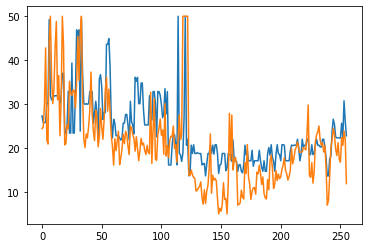

In [221]:
#plot prediction and y 
import matplotlib.pyplot as plt

y_test['Predictions'] = 0
y_test['Predictions'] = preds
y_test
plt.plot(y_test['Predictions'])
plt.plot(y_test[0])

In [222]:
# KNeighborsRegressor with 5 variable is similar to linear regression with only the most significant variable

In [251]:
#using gridsearch to find the best parameter of 2
params = {'n_neighbors':[1,2,3,4,5,6,7,8,9,10,11,12,13]}
knn = neighbors.KNeighborsRegressor()
model = GridSearchCV(knn, params, cv=2)
#fit the model and make predictions
model.fit(x_train,y_train)
preds = model.predict(x_test)
rms=np.sqrt(np.mean(np.power((np.array(y_test)-np.array(preds)),2)))
rms


7.61838488729042

In [252]:
#using gridsearch to find the best parameter of 3
params = {'n_neighbors':[1,2,3,4,5,6,7,8,9,10,11,12,13]}
knn = neighbors.KNeighborsRegressor()
model = GridSearchCV(knn, params, cv=3)
#fit the model and make predictions
model.fit(x_train,y_train)
preds = model.predict(x_test)
rms=np.sqrt(np.mean(np.power((np.array(y_test)-np.array(preds)),2)))
rms


C:\Users\Jean-Philippe\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


7.61838488729042

In [253]:
#using gridsearch to find the best parameter of 4
params = {'n_neighbors':[1,2,3,4,5,6,7,8,9,10,11,12,13]}
knn = neighbors.KNeighborsRegressor()
model = GridSearchCV(knn, params, cv=4)
#fit the model and make predictions
model.fit(x_train,y_train)
preds = model.predict(x_test)
rms=np.sqrt(np.mean(np.power((np.array(y_test)-np.array(preds)),2)))
rms


C:\Users\Jean-Philippe\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


7.80759658621813

In [254]:
#using gridsearch to find the best parameter of 6
params = {'n_neighbors':[1,2,3,4,5,6,7,8,9,10,11,12,13]}
knn = neighbors.KNeighborsRegressor()
model = GridSearchCV(knn, params, cv=6)
#fit the model and make predictions
model.fit(x_train,y_train)
preds = model.predict(x_test)
rms=np.sqrt(np.mean(np.power((np.array(y_test)-np.array(preds)),2)))
rms

C:\Users\Jean-Philippe\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


7.80759658621813

In [255]:
#using gridsearch to find the best parameter of 7
params = {'n_neighbors':[1,2,3,4,5,6,7,8,9,10,11,12,13]}
knn = neighbors.KNeighborsRegressor()
model = GridSearchCV(knn, params, cv=7)
#fit the model and make predictions
model.fit(x_train,y_train)
preds = model.predict(x_test)
rms=np.sqrt(np.mean(np.power((np.array(y_test)-np.array(preds)),2)))
rms

C:\Users\Jean-Philippe\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


7.4567956631853605

In [256]:
#using gridsearch to find the best parameter of 8
params = {'n_neighbors':[1,2,3,4,5,6,7,8,9,10,11,12,13]}
knn = neighbors.KNeighborsRegressor()
model = GridSearchCV(knn, params, cv=8)
#fit the model and make predictions
model.fit(x_train,y_train)
preds = model.predict(x_test)
rms=np.sqrt(np.mean(np.power((np.array(y_test)-np.array(preds)),2)))
rms

C:\Users\Jean-Philippe\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


8.325598233010046

In [257]:
#using gridsearch to find the best parameter of 9
params = {'n_neighbors':[1,2,3,4,5,6,7,8,9,10,11,12,13]}
knn = neighbors.KNeighborsRegressor()
model = GridSearchCV(knn, params, cv=9)
#fit the model and make predictions
model.fit(x_train,y_train)
preds = model.predict(x_test)
rms=np.sqrt(np.mean(np.power((np.array(y_test)-np.array(preds)),2)))
rms

C:\Users\Jean-Philippe\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


7.80759658621813

In [258]:
#using gridsearch to find the best parameter of 10 
params = {'n_neighbors':[1,2,3,4,5,6,7,8,9,10,11,12,13]}
knn = neighbors.KNeighborsRegressor()
model = GridSearchCV(knn, params, cv=10)
#fit the model and make predictions
model.fit(x_train,y_train)
preds = model.predict(x_test)
rms=np.sqrt(np.mean(np.power((np.array(y_test)-np.array(preds)),2)))
rms

7.80759658621813

In [259]:
#using gridsearch to find the best parameter of 11 
params = {'n_neighbors':[1,2,3,4,5,6,7,8,9,10,11,12,13]}
knn = neighbors.KNeighborsRegressor()
model = GridSearchCV(knn, params, cv=11)
#fit the model and make predictions
model.fit(x_train,y_train)
preds = model.predict(x_test)
rms=np.sqrt(np.mean(np.power((np.array(y_test)-np.array(preds)),2)))
rms

C:\Users\Jean-Philippe\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


7.493751375567476

In [260]:
#using gridsearch to find the best parameter of 12
params = {'n_neighbors':[1,2,3,4,5,6,7,8,9,10,11,12,13]}
knn = neighbors.KNeighborsRegressor()
model = GridSearchCV(knn, params, cv=12)
#fit the model and make predictions
model.fit(x_train,y_train)
preds = model.predict(x_test)
rms=np.sqrt(np.mean(np.power((np.array(y_test)-np.array(preds)),2)))
rms

C:\Users\Jean-Philippe\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


7.355080797766036

In [ ]:
# KNeighborsRegressor with different variable size are performing almost the same

In [283]:
# predict using RandomForestRegressor 
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from scipy.stats import spearmanr, pearsonr
rf = RandomForestRegressor(n_estimators=100, oob_score=True, random_state=0, max_depth = 1)
rf.fit(xtrain, ytrain)
predicted_train = rf.predict(xtrain)
predicted_test = rf.predict(xtest)
rms=np.sqrt(np.mean(np.power((np.array(ytest[0])-np.array(predicted_test)),2)))
print(rms)

5.632022979005243


In [ ]:
#RandomForestRegressor show a good improvement over other technics 

#Pseudocode for Linear Regression
https://www.codesansar.com/numerical-methods/linear-regression-method-pseudocode.htm
1. Start

2. Read Number of Data (n)

3. For i=1 to n:
     Read Xi and Yi
   Next i

4. Initialize:
     sumX = 0
     sumX2 = 0
     sumY = 0
     sumXY = 0

5. Calculate Required Sum
   For i=1 to n:
     sumX = sumX + Xi
     sumX2 = sumX2 + Xi * Xi
     sumY = sumY + Yi
     sumXY = sumXY + Xi * Yi
   Next i

6. Calculate Required Constant a and b of y = a + bx:
   b = (n * sumXY - sumX * sumY)/(n*sumX2 - sumX * sumX)
   a = (sumY - b*sumX)/n

7. Display value of a and b

8. Stop


